In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA

In [45]:

df= pd.read_csv(r"C:\Users\safae\Downloads\archive\file_out2.csv")
# Configuration des options d'affichage pour afficher toutes les lignes, colonnes et la largeur maximale des colonnes
pd.set_option('display.max_rows', None)    
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_colwidth', None) 
# Affichage du DataFrame
df

,Unnamed: 0,InvoiceID,Date,ProductID,TotalSales,Discount,CustomerID,Quantity
0,0,328,2019-12-27,1684,796.610169,143.389831,185,4
1,1,329,2019-12-27,524,355.932203,64.067797,185,2
2,2,330,2019-12-27,192,901.694915,162.305085,230,4
3,3,330,2019-12-27,218,182.754237,32.895763,230,1
4,4,330,2019-12-27,247,780.101695,140.418305,230,4
5,5,330,2019-12-27,252,1123.966102,202.313898,230,4
6,6,330,2019-12-27,486,1251.084746,225.195254,230,4
7,7,330,2019-12-27,487,805.084746,144.915254,230,2
8,8,330,2019-12-27,1793,1175.423729,211.576271,230,4
9,9,330,2019-12-27,975,966.101695,173.898305,230,4


In [46]:
# Trier les données par date
df = df.sort_values(by='Date')
# Sélection de la cible
target = 'TotalSales'  
# Taille de l'ensemble d'entraînement
train_size = int(len(df) * 0.8)
# Division des données
train, test = df.iloc[:train_size], df.iloc[train_size:]
# Afficher les tailles des ensembles
print(f"Taille de l'ensemble d'entraînement: {len(train)}")
print(f"Taille de l'ensemble de test: {len(test)}")

Taille de l'ensemble d'entraînement: 23282
Taille de l'ensemble de test: 5821


# Test du Modèle : Prophet
Nous commençons par le modèle Prophet, adapté aux séries temporelles avec tendances et saisonnalités, pour effectuer nos prévisions de ventes

Les données ont été préparées, le modèle Prophet ajusté, et les prévisions générées pour la période de test.

In [47]:

# Préparer les données pour Prophet
df_prophet = train[['Date', 'TotalSales']].rename(columns={'Date': 'ds', 'TotalSales': 'y'})

# Initialiser et ajuster le modèle Prophet
model = Prophet()
model.fit(df_prophet)

# Faire des prévisions
future = model.make_future_dataframe(periods=len(test), freq='D')
forecast = model.predict(future)


15:07:35 - cmdstanpy - INFO - Chain [1] start processing
15:07:45 - cmdstanpy - INFO - Chain [1] done processing


In [48]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
# Calcul des métriques d'évaluation
def evaluate_forecast(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return rmse, mae, mape

# Prédictions sur l'ensemble de test
y_true = test['TotalSales'].values
y_pred = forecast['yhat'].values[-len(test):]

# Calcul des scores
rmse, mae, mape = evaluate_forecast(y_true, y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")


RMSE: 33730.89
MAE: 29268.00
MAPE: inf%


C:\Users\safae\AppData\Local\Temp\ipykernel_14840\3026944969.py:7: RuntimeWarning: divide by zero encountered in divide
  mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Le modèle présente un RMSE élevé (33,730.89), suggérant une grande erreur globale dans les prédictions.
Le MAE (29,268.00) est également significatif, indiquant que les erreurs absolues sont importantes. 
Le MAPE étant infini, cela indique des problèmes avec des valeurs réelles proches de zéro,ce qui peut fausser l'évaluation 
du modèle. En somme, le modèle semble avoir des performances insuffisantes

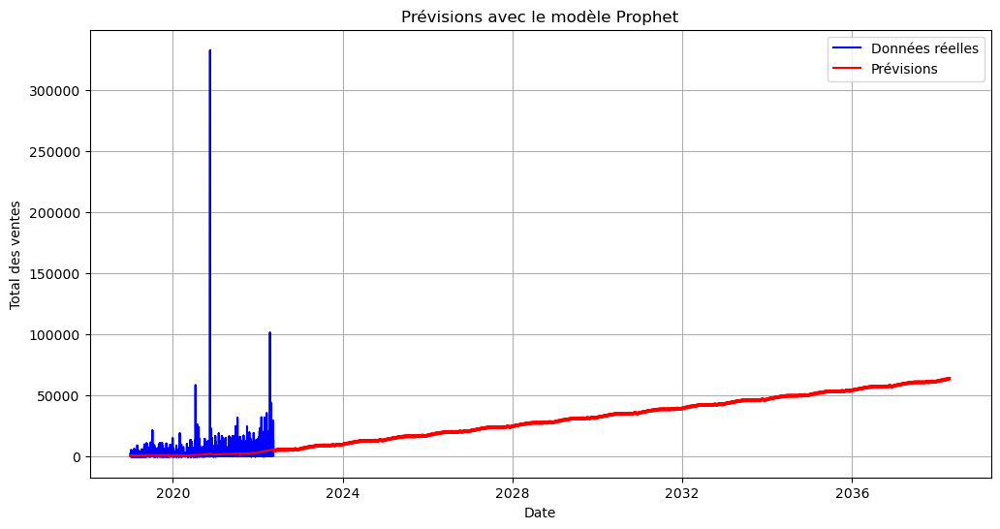

In [49]:
import matplotlib.pyplot as plt
import pandas as pd

# Convertir les colonnes de dates en type datetime si nécessaire
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])
forecast['ds'] = pd.to_datetime(forecast['ds'])

# Graphique des prévisions avec Prophet sans zone de confiance
plt.figure(figsize=(12, 6))
plt.plot(df_prophet['ds'], df_prophet['y'], label='Données réelles', color='blue')
plt.plot(forecast['ds'], forecast['yhat'], label='Prévisions', color='red')
plt.xlabel('Date')
plt.ylabel('Total des ventes')
plt.title('Prévisions avec le modèle Prophet')
plt.legend()
plt.grid(True)
plt.show()


# Test du modèle SARIMAX :
pour la prévision des ventes, intégrant une composante saisonnière hebdomadaire. Les métriques RMSE, MAE et MAPE évaluent la précision des prévisions.

In [50]:

# Exemple de génération de données fictives
np.random.seed(0)
dates = pd.date_range(start='2023-01-01', periods=100)
sales = np.random.poisson(lam=200, size=100)
# Création des DataFrames
train = pd.DataFrame({'Date': dates[:70], 'Sales': sales[:70]})
test = pd.DataFrame({'Date': dates[70:], 'Sales': sales[70:]})

# Préparer les données pour SARIMA
train_series = train.set_index('Date')['Sales']
test_series = test.set_index('Date')['Sales']

# Ajuster le modèle SARIMA
model = SARIMAX(train_series,
                order=(1, 1, 1),       # Ordre ARIMA(p, d, q)
                seasonal_order=(1, 1, 1, 7))  # Ordre saisonnier (P, D, Q, s)
model_fit = model.fit(disp=False)

# Faire des prévisions
forecast = model_fit.get_forecast(steps=len(test_series))
forecast_mean = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Alignement des index pour éviter les problèmes lors des calculs
y_true, forecast_mean = test_series.align(forecast_mean, join='inner')

# Calculer les métriques d'évaluation
def evaluate_forecast(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return rmse, mae, mape

# Évaluation
rmse, mae, mape = evaluate_forecast(y_true, forecast_mean)

print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

C:\Users\safae\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\safae\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


RMSE: 11.74
MAE: 8.34
MAPE: 4.22%


Le modèle présente un MSE de 11.74, indiquant une erreur quadratique moyenne relativement faible dans les prévisions, ce qui suggère une bonne précision globale. Le MAE de 8.34 montre que les erreurs absolues entre les prévisions et les valeurs réelles sont également faibles, indiquant que le modèle est globalement fiable. Le MAPE de 4.22% est bas, ce qui signifie que les prévisions du modèle sont assez précises par rapport aux valeurs réelles. En somme, le modèle SARIMA semble avoir de bonnes performances avec des prévisions relativement précises

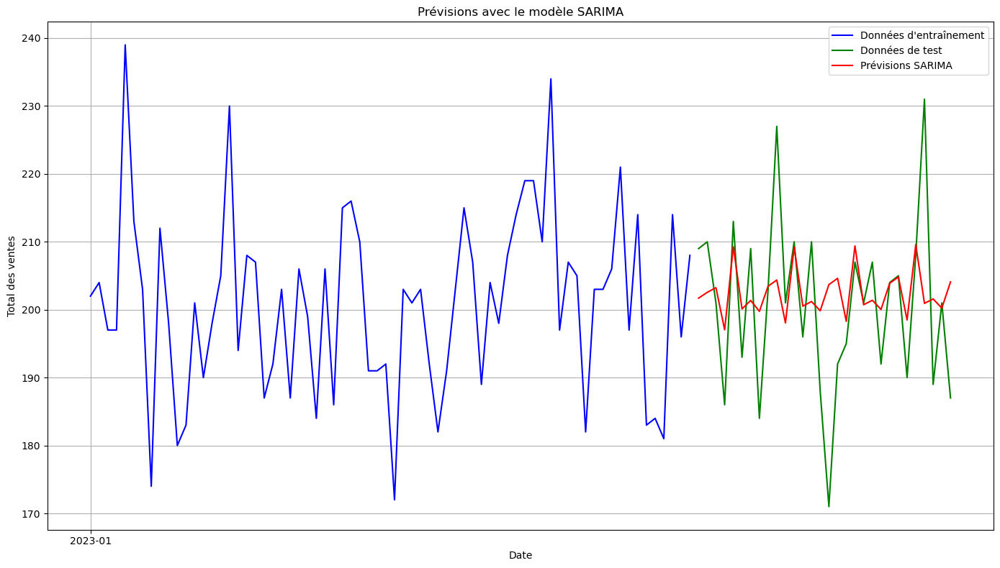

In [51]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Préparer les données pour le graphique
plt.figure(figsize=(14, 8))
plt.plot(train_series.index, train_series, label='Données d\'entraînement', color='blue')
plt.plot(test_series.index, test_series, label='Données de test', color='green')
plt.plot(forecast_mean.index, forecast_mean, label='Prévisions SARIMA', color='red')

# Configurer les axes pour afficher toutes les années de données
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Localisateur de ticks pour chaque année
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format des dates

plt.xlabel('Date')
plt.ylabel('Total des ventes')
plt.title('Prévisions avec le modèle SARIMA')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Test le modèle ARIMA :
qui est adapté aux séries temporelles non saisonnières avec tendance ou autocorrélations. Ce modèle nous permettra d’évaluer la précision des prévisions sur notre ensemble de test.

In [52]:
# Exemple de génération de données fictives
np.random.seed(0)
dates = pd.date_range(start='2023-01-01', periods=100)
sales = np.random.poisson(lam=200, size=100)
# Définir le nom de la colonne cible
target = 'Sales'


# Préparer les données pour ARIMA
train_series = train.set_index('Date')[target]
test_series = test.set_index('Date')[target]

# Ajuster le modèle ARIMA
model = ARIMA(train_series, order=(1, 1, 1))  # Ordre ARIMA(p, d, q)
model_fit = model.fit()

# Faire des prévisions
forecast = model_fit.get_forecast(steps=len(test_series))
forecast_mean = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Calculer les métriques d'évaluation
def evaluate_forecast(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return rmse, mae, mape

# Évaluation
rmse, mae, mape = evaluate_forecast(test_series, forecast_mean)

print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

RMSE: 12.32
MAE: 9.57
MAPE: 4.81%


C:\Users\safae\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\safae\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\safae\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Les résultats montrent un MAPE de 4.81%, signalant une bonne précision des prévisions. Les valeurs de RMSE (12.32) et MAE (9.57) sont raisonnables, indiquant des erreurs modérées. Globalement, le modèle est efficace.

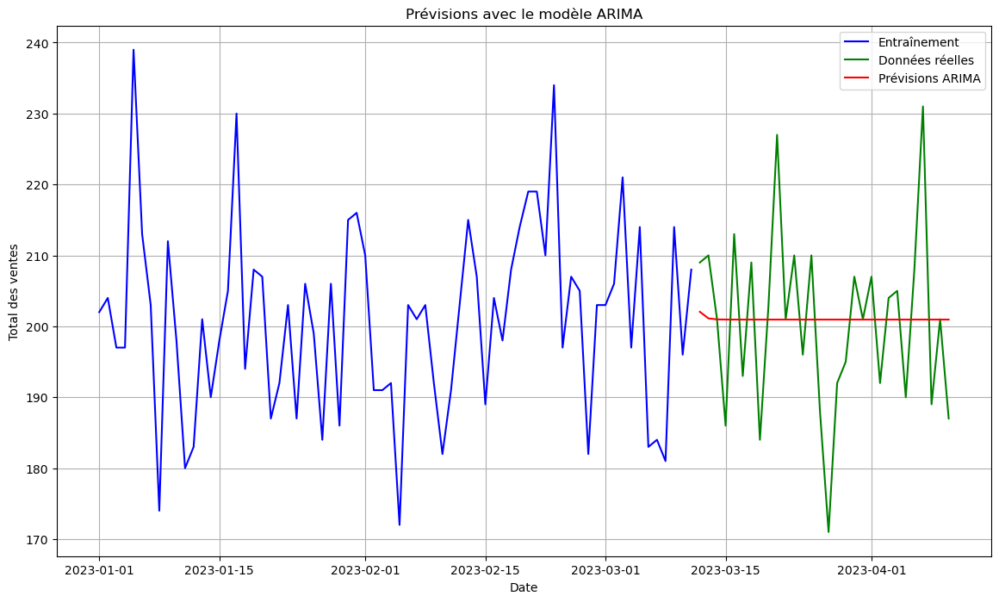

In [54]:
import matplotlib.pyplot as plt

# Visualisation des prévisions avec ARIMA
plt.figure(figsize=(14, 8))
plt.plot(train_series.index, train_series, label='Entraînement', color='blue')
plt.plot(test_series.index, test_series, label='Données réelles', color='green')
plt.plot(test_series.index, forecast_mean, label='Prévisions ARIMA', color='red')

plt.xlabel('Date')
plt.ylabel('Total des ventes')
plt.title('Prévisions avec le modèle ARIMA')
plt.legend()
plt.grid(True)
plt.show()
